In [16]:
import numpy as np
np.set_printoptions(precision=3) # only 3 decimals in print
import matplotlib.pyplot as plt
from matplotlib import animation
from matplotlib_inline.backend_inline import set_matplotlib_formats
set_matplotlib_formats('svg', 'pdf')
from scipy.integrate import solve_ivp
from scipy.optimize import fsolve

plt.rc("axes", labelsize = 11)
plt.rc("xtick", labelsize = 10, top = True, direction="in")
plt.rc("ytick", labelsize = 10, right = True, direction="in")
plt.rc("axes", titlesize = 13)
plt.rc("legend", fontsize = 10, loc = "best")
plt.rc('animation', html='jshtml')

# 8.3 Linear ramp

Text(0, 0.5, '$x$ (m)')

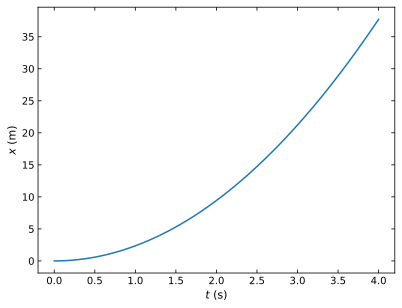

In [17]:
tinit = 0
tfinal = 4
trange = [tinit, tfinal]
ts = np.linspace(tinit, tfinal, 100)

y = lambda x: -22.5/30*x+22.5
xinit = [1e-6]
yinit = y(0)
dydx = lambda x: -22.5/30
dxdt = lambda t, x: (2*9.82*(yinit-y(x)))**0.5 / (1+(dydx(x))**2)**0.5

# Event function
f = lambda t, x: 30-x[0]

mysol = solve_ivp(dxdt,
                  trange,
                  xinit,
                  t_eval=ts,
                  events=[f])

ts = mysol.t
xs = mysol.y[0]
t_events = mysol.t_events[0]

fig, ax = plt.subplots()
ax.plot(ts, xs)
ax.set_xlabel(r'$t$ (s)')
ax.set_ylabel(r'$x$ (m)')

In [18]:
# Animating box sliding down the ramp
fig, ax = plt.subplots()
ax.plot(xs, y(xs))
ax.set_xlabel(r'$x$ (m)')
ax.set_ylabel(r'$y$ (m)')
plt.close()

# Create a box as a ball
ball = ax.plot([], [], 'o', color='r')[0]

def update(i):
    ball.set_data(xs[i], y(xs[i]))
    return [ball]

# Animate!
anim = animation.FuncAnimation(fig,
                               update,
                               frames=len(xs),
                               interval=15,
                               blit=True)
anim

C:\Users\Jakob\AppData\Local\Temp\ipykernel_23896\3931276432.py:12: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  ball.set_data(xs[i], y(xs[i]))
C:\Users\Jakob\AppData\Local\Temp\ipykernel_23896\3931276432.py:12: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  ball.set_data(xs[i], y(xs[i]))


# 8.4 Parabola-shaped ramp

In [19]:
tinit = 0
tfinal = 4
trange = [tinit, tfinal]
ts = np.linspace(tinit, tfinal, 100)

y = lambda x: -22.5/30*x+22.5
xinit = [1e-6]
yinit = y(0)
dydx = lambda x: -22.5/30
dxdt = lambda t, x: (2*9.82*(yinit-y(x)))**0.5 / (1+(dydx(x))**2)**0.5

# Event function
f = lambda t, x: 30-x[0]

mysol = solve_ivp(dxdt,
                  trange,
                  xinit,
                  t_eval=ts,
                  events=[f])

ts = mysol.t
xs = mysol.y[0]
t_events = mysol.t_events[0]

# Parabola curve
y2 = lambda x: 3/40*x**2 - 3*x + 45/2
y2init = y2(0)
dy2dx = lambda x: 3/20*x - 3
dx2dt = lambda t, x: (2*9.82*(y2init-y2(x)))**0.5 / (1+(dy2dx(x))**2)**0.5

mysol2 = solve_ivp(dx2dt,
                    trange,
                    xinit,
                    t_eval=ts,
                    events=[f])
t2s = mysol2.t
x2s = mysol2.y[0]
t2_events = mysol2.t_events[0]

# Animating boxes sliding down the ramps
fig, ax = plt.subplots()
ax.plot(xs, y(xs))
ax.plot(xs, y2(xs))
ax.set_xlabel(r'$x$ (m)')
ax.set_ylabel(r'$y$ (m)')
plt.close()

# Create a box as a ball
ball = ax.plot([], [], 'o', color='r')[0]
ball2 = ax.plot([], [], 'o', color='b')[0]

def update(i):
    ball.set_data(xs[i], y(xs[i]))
    ball2.set_data(x2s[i], y2(x2s[i]))
    return [ball, ball2]

# Animate!
anim = animation.FuncAnimation(fig,
                               update,
                               frames=len(xs),
                               interval=15,
                               blit=True)

# When do they reach y=0?
print(f'The box on the linear ramp reaches y=0 at t = {t_events[0]:.2f} s.')
print(f'The box on the parabolic ramp reaches y=0 at t = {t2_events[0]:.2f} s.')
print(f'The time difference is {t_events[0]-t2_events[0]:.3f} s.')
anim

C:\Users\Jakob\AppData\Local\Temp\ipykernel_23896\856257141.py:53: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  ball.set_data(xs[i], y(xs[i]))
C:\Users\Jakob\AppData\Local\Temp\ipykernel_23896\856257141.py:54: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  ball2.set_data(x2s[i], y2(x2s[i]))
C:\Users\Jakob\AppData\Local\Temp\ipykernel_23896\856257141.py:53: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  ball.set_data(xs[i], y(xs[i]))
C:\Users\Jakob\AppData\Local\Temp\ipykernel_23896\856257141.py:54: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  ball2.set_data(x2s[i], y2(x2s[i]))


The box on the linear ramp reaches y=0 at t = 3.57 s.
The box on the parabolic ramp reaches y=0 at t = 3.47 s.
The time difference is 0.092 s.


# 8.5 Brachistochrone curve

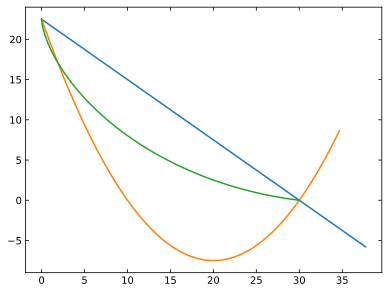

In [20]:
# Solving for phi using fsolve
from scipy.optimize import fsolve

# Define the function based on the rearranged equation
def equation(phi):
    return (np.cos(phi) - 1) / (phi - np.sin(phi)) + 3/4

# Initial guess for phi (you can adjust this based on the expected solution range)
initial_guess = 1.0
phi1 = fsolve(equation, initial_guess)[0]

# Let x=0 and y=22.5 to solve for a and y0:
def equations(vars):
    a, y0 = vars
    eq1 = a * (phi1 - np.sin(phi1)) - 30
    eq2 = a * (1 + np.cos(phi1)) + y0 - 0
    return [eq1, eq2]

# Initial guess for a and y0
initial_guess = [1.0, 1.0]

# Solve the system of equations
a, y0 = fsolve(equations, initial_guess)

# Plotting cycloid ramp along with the other two ramps
fig, ax = plt.subplots()
phis = np.linspace(0, phi1, 100)
x3s = a * (phis - np.sin(phis))
y3s = a * (1 + np.cos(phis)) + y0
ax.plot(xs, y(xs))
ax.plot(x2s, y2(x2s))
ax.plot(x3s, y3s)

In [21]:
# Getting y(x) for the cycloid ramp
def y3(x):
    phi = fsolve(lambda phi: a * (phi - np.sin(phi)) - x, 1.0)[0]
    y = a * (1 + np.cos(phi)) + y0
    return y

# Getting dy/dx for the cycloid ramp with the forward finite difference method
def dy3dx(x):
    h = 1e-6
    return (y3(x+h) - y3(x)) / h

# Cycloid ramp
dx3dt = lambda t, x: (2*9.82*(22.5-y3(x)))**0.5 / (1+(dy3dx(x))**2)**0.5
mysol3 = solve_ivp(dx3dt,
                    trange,
                    xinit,
                    t_eval=ts,
                    events=[f])
t3s = mysol3.t
x3s = mysol3.y[0]
y3s = [y3(x) for x in x3s]
t3_events = mysol3.t_events[0]

# Animating boxes sliding down the ramps
fig, ax = plt.subplots()
ax.plot(xs, y(xs), c='tab:red')
ax.plot(xs, y2(xs), c='tab:green')
ax.plot(x3s, y3s, c='tab:blue')
ax.set_xlabel(r'$x$ (m)')
ax.set_ylabel(r'$y$ (m)')
plt.close()

# Create a box as a ball
ball = ax.plot([], [], 'o', ms=10, color='r')[0]
ball2 = ax.plot([], [], 'o', ms=10, color='g')[0]
ball3 = ax.plot([], [], 'o', ms=10, color='b')[0]

def update(i):
    ball.set_data(xs[i], y(xs[i]))
    ball2.set_data(x2s[i], y2(x2s[i]))
    ball3.set_data(x3s[i], y3s[i])
    return [ball, ball2, ball3]

# Animate!
anim = animation.FuncAnimation(fig,
                               update,
                               frames=len(xs),
                               interval=15,
                               blit=True)

# When do they reach y=0?
print(f'The box on the linear ramp reaches y=0 at t = {t_events[0]:.2f} s.')
print(f'The box on the parabolic ramp reaches y=0 at t = {t2_events[0]:.2f} s.')
print(f'The box on the cycloid ramp reaches y=0 at t = {t3_events[0]:.2f} s.')
anim

C:\Users\Jakob\AppData\Local\Temp\ipykernel_23896\2633981311.py:39: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  ball.set_data(xs[i], y(xs[i]))
C:\Users\Jakob\AppData\Local\Temp\ipykernel_23896\2633981311.py:40: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  ball2.set_data(x2s[i], y2(x2s[i]))
C:\Users\Jakob\AppData\Local\Temp\ipykernel_23896\2633981311.py:41: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  ball3.set_data(x3s[i], y3s[i])
C:\Users\Jakob\AppData\Local\Temp\ipykernel_23896\2633981311.py:39: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  ball.set_data(xs[i], y(xs[i]))
C:\Users\Jakob\AppData\Local\Temp\ipykernel_2389

The box on the linear ramp reaches y=0 at t = 3.57 s.
The box on the parabolic ramp reaches y=0 at t = 3.47 s.
The box on the cycloid ramp reaches y=0 at t = 3.10 s.
